# In this notebook:

* General simple approaches to find release frame from trajectories:
    * Only maximum of elbow and wrist height
    * moment the difference shoulder-ellbow/wrist is highest
    * gradient method
* Tests to recognize ball as a white round object in frame without difference images
* Show the release frame images of the NN outputs
* For more general model: must work also for different input - question: how to normalize data? high quality videos look very different from low quality video trajectories --> Compare different normalization methods - to make high quality videos comparable to old ones
* Plot distribution of release, first movement ... from csv file

In [3]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pylab as plt
import json
from scipy.signal import argrelextrema
from scipy import ndimage
import ast
import pandas as pd

## Get data

In [ ]:
from data_preprocess import Preprocessor
prepro = Preprocessor("cf_data.csv")
prepro.remove_small_classes(10)
joints_array = prepro.get_coord_arr()
print(joints_array.shape)

release = prepro.get_release_frame(60,120)
assert(len(release)==len(joints_array))
files_csv = prepro.cf["play_id"].values
assert(len(files_csv)==len(joints_array))

## Functions for different approaches

In [ ]:
def new_data(directory):
    from os import listdir
    out_arr = []
    files = []
    dire = listdir(directory)
    for filename in dire:
        # filename = fi.split("_")[0] #"#33 Logan Trowbridge"
        #print(filename)
        if filename[-4:]==".mp4" or filename[0]==".":
            continue
        if filename.split("_")[0]+".mp4" in listdir("/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/batter"):
            continue
        files.append(filename.split("_")[0])
        coordinates = ["x", "y"]
        joints_list = ["right_shoulder", "left_shoulder", "right_elbow", "right_wrist","left_elbow", "left_wrist",
                "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
                "right_eye", "right_ear","left_eye", "left_ear"]

        def from_json(file):
            with open(file, 'r') as inf:
                out = json.load(inf)

            liste = []
            for fr in out["frames"]:
                l_joints = []
                for j in joints_list[:12]:
                    l_coo = []
                    for xy in coordinates:
                        l_coo.append(fr[j][xy])
                    l_joints.append(l_coo)
                liste.append(l_joints)
            return np.array(liste)

        out_arr.append(from_json("/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/outputs_example/"+filename))
    return out_arr, files

def higher_shoulders_max(joints_array):
    wrist_ellbow_right = np.mean(joints_array[:, 2:4, 0], axis = 1) # y coordinate of ellbow and wrist
    wrist_ellbow_left = np.mean(joints_array[:, 4:6, 0], axis = 1)
    shoulders = np.mean(joints_array[: ,:2,0], axis = 1) # y coordinate of shoulders
    if min(wrist_ellbow_right-shoulders)<min(wrist_ellbow_left-shoulders):
        higher = np.argmin(wrist_ellbow_right-shoulders)
        print("higher shoulders right", higher)
        return higher
    else:
        higher = np.argmin(wrist_ellbow_left-shoulders)
        print("higher shoulders left", higher)
        return higher
    
def surround_grad_method(frames, joint =3):
    right_wrist = 700-np.array(frames[:,joint,0])
    highest_ind = np.array(argrelextrema(right_wrist, np.greater))[0] # np.argsort(right_wrist)
    highest = highest_ind[np.argsort(right_wrist[highest_ind])]
    #print("max", np.argmax(right_wrist), "argsort", np.argsort(right_wrist)[-5:], "argextrema", highest[-5:])

    # with_grad:
    smooth = ndimage.filters.gaussian_filter1d(right_wrist, sigma = 3)
    grad = np.gradient(smooth)

    highest_5 = list(highest_ind) #[-4:])
    highest_5.append(np.argmax(right_wrist))
    #print(highest_5)
    surrounding_grad = []
    for i in range(len(highest_5)):
        if highest_5[i]<5: # or highest_5[i]>160:
            surrounding_grad.append(0)
        else:
            up_down_grad = np.mean(grad[highest_5[i]-surround_range:highest_5[i]])- np.mean(grad[highest_5[i]:highest_5[i]+surround_range])
            surr_five_grad = np.mean(np.absolute(grad[highest_5[i]-5:highest_5[i]+5]))
            surrounding_grad.append(up_down_grad)
    #print(surrounding_grad, highest_5[np.argmax(surrounding_grad)])
    # with_surrounding_grad.append(highest_5[np.argmax(surrounding_grad)])
    #if abs(release[j]-highest_5[np.argmax(surrounding_grad)])>3:
    # Plotting
    fig = plt.figure(figsize = (20,10))
    #for i in range(12):
        #plt.plot(joints_array[j,:,i,1], label = joints_list[i]) #, joints_array[i,:,3,0])
    plt.plot(smooth)
    #plt.plot(np.gradient(joints_array[j,:,3,1]))
    #plt.legend()
    plt.show()
    return highest_5[np.argmax(surrounding_grad)]

# Test different methods based on gradient to find release frame

In [ ]:
just_max = []
with_grad = []
with_surrounding_grad = []
higher_shoulders = []

surround_range = 5
joints_list = ["right_shoulder", "left_shoulder", "right_elbow", "right_wrist","left_elbow", "left_wrist",
            "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
            "right_eye", "right_ear","left_eye", "left_ear"]
smooth_all = ndimage.filters.gaussian_filter1d(joints_array, axis=1, sigma = 3)
grad_all = np.gradient(smooth_all, axis=1)

nr = 50
for j in range(nr): #len(joints_array)):
    print(files_csv[j])
    print("truth:", release[j])
    right_wrist = joints_array[j,:,3,0]

    # just_max
    just_max.append(np.argmin(right_wrist))
    highest_ind = np.array(argrelextrema(right_wrist, np.less))[0] # np.argsort(right_wrist)
    highest = highest_ind[np.argsort(right_wrist[highest_ind])]
    print("min", np.argmin(right_wrist), "argsort", np.argsort(right_wrist)[:5], "argextrema", highest[:5])

    # with_grad:
    smooth = ndimage.filters.gaussian_filter1d(right_wrist, sigma = 3)
    grad = np.gradient(smooth)
    grad2 = np.gradient(np.gradient(smooth))
    # maxima = argrelextrema(grad, np.greater)
    # minima = argrelextrema(grad, np.less)
    extrema = np.where((grad2[:-1] * grad2[1:]) < 0)[0]
    #print(extrema)
    for i in range(5):
        if np.sum(np.absolute(highest[i]-extrema)<10)>1:
            #print("found")
            #print(highest[-i])
            with_grad.append(highest[i])
            #print("differences", np.absolute(highest[-i]-extrema))
            #print("smaller5:", np.sum(np.absolute(highest[-i]-extrema)<10))
            break
        else:
            #print("not found")
            if i==4:
                with_grad.append(0)
        #print(highest[-i])
        #print("differences", np.absolute(highest[-i]-extrema))
        #print("smaller5:", np.sum(np.absolute(highest[-i]-extrema)<10))

    # surrounding_grad:
    highest_5 = list(highest_ind) #[-4:])
    highest_5.append(np.argmin(right_wrist))
    # print("highest_indizes", highest_5)
    surrounding_grad = []
    for i in range(len(highest_5)):
        if highest_5[i]<5 or highest_5[i]>160:
            surrounding_grad.append(0)
        else:
            up_down_grad = - np.mean(grad[highest_5[i]-surround_range:highest_5[i]])+ np.mean(grad[highest_5[i]:highest_5[i]+surround_range])
            surr_five_grad = np.mean(np.absolute(grad[highest_5[i]-5:highest_5[i]+5]))
            surrounding_grad.append(up_down_grad)
    print("surrounding_grad", highest_5[np.argmax(surrounding_grad)])
    with_surrounding_grad.append(highest_5[np.argmax(surrounding_grad)])

    # higher shoulders:
    wrist_ellbow_right = np.mean(joints_array[j, :, 2:4, 0], axis = 1) # y coordinate of ellbow and wrist
    wrist_ellbow_left = np.mean(joints_array[j, :, 4:6, 0], axis = 1)
    shoulders = np.mean(joints_array[j,: ,:2,0], axis = 1) # y coordinate of shoulders
    if min(wrist_ellbow_right-shoulders)<min(wrist_ellbow_left-shoulders):
        higher = np.argmin(wrist_ellbow_right-shoulders)
        print("higher shoulders right", higher)
    else:
        higher = np.argmin(wrist_ellbow_left-shoulders)
        print("higher shoulders left", higher)

    higher_shoulders.append(higher)



    if abs(release[j]-higher)>3:
        # Plotting
        fig = plt.figure(figsize = (20,10))
        #for i in range(12):
         #   plt.plot(joints_array[j,:,i,0], label = joints_list[i]) #, joints_array[i,:,3,0])
        plt.plot(right_wrist)
        #plt.plot(np.gradient(joints_array[j,:,3,1]))
        plt.legend()
        plt.show()

    frame_nr = higher
    f = "/Volumes/Nina Backup/videos/atl/2017-06-07/center field/490987-"+files_csv[j]+".mp4"
    path_input_dat=f+'.dat'
    for i in open(path_input_dat).readlines():
        datContent=ast.literal_eval(i)
    bottom_p=datContent['Pitcher']['bottom']
    left_p=datContent['Pitcher']['left']
    right_p=datContent['Pitcher']['right']
    top_p=datContent['Pitcher']['top']
    cap = cv2.VideoCapture(f)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_nr)
    ret, frame = cap.read()
    #print(joints_arr[i][3][1])
    frame = frame[top_p:bottom_p, left_p:right_p]
    for l in range(12):
        cv2.circle(frame, (int(joints_array[j,frame_nr,l,1]),int(joints_array[j,frame_nr,l,0])) , 2, (250,0,0), thickness=-1)
    plt.imshow(frame)
    plt.show()

## Evaluation (Accuracy)

In [ ]:
dic = {"just_max": just_max, "with_grad": with_grad, "with_surrounding_grad":with_surrounding_grad, "higher_shoulders":higher_shoulders}
for key in list(dic.keys()):
    liste = dic[key]
    correct = np.sum(np.array(np.absolute(liste-release[:nr]))<3)
    print(key, correct/float(nr))

In [ ]:
from os import listdir
directory = "/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/outputs_example/"
vid_dir = "/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/pitcher/"
new_joints_arr, files = new_data(directory)
#print(len(new_joints_arr))
#print(files)
for i, arr in enumerate(new_joints_arr):
    #arr = ndimage.filters.gaussian_filter1d(np.array(arr), axis=0, sigma = 2)
    #print(arr)
    fig = plt.figure(figsize = (20,10))
    for k in range(12):
    #k = 3
        plt.plot(arr[:,k,0], label = joints_list[k]) #, joints_array[i,:,3,0])
    #plt.plot(np.mean(arr[:, 2:4, 0], axis = 1), label = "wrist_ellbow")
    #plt.plot(np.mean(arr[:, :2, 0], axis = 1), label = "shoulders")
    wrist_ellbow = np.mean(arr[:500, 2:4, 0], axis = 1) # y coordinate of ellbow and wrist
    shoulders = np.mean(arr[:500,:2,0], axis = 1) # y coordinate of shoulders
    plt.plot(wrist_ellbow-shoulders)
    frame_nr = higher_shoulders_max(arr) #np.argmin(wrist_ellbow-shoulders)
    #plt.ylim(900,100)
    plt.legend()
    plt.show()
    # frame_nr = np.argmin(np.array(arr)[:,3,0]) #surround_grad_method(arr)
    print(frame_nr)
    #print(files[i]+".mp4" in listdir(directory))
    cap = cv2.VideoCapture(vid_dir+files[i]+".mp4")
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_nr)
    ret, frame = cap.read()
    print(new_joints_arr[i][3][1])
    cv2.circle(frame, (int(new_joints_arr[i][frame_nr][3][1]),int(new_joints_arr[i][frame_nr][3][0])) , 8, (250,0,0), thickness=-1)
    plt.imshow(frame)
    plt.show()

# Release frame by white circle

[1050, 650]
29.41176470588235


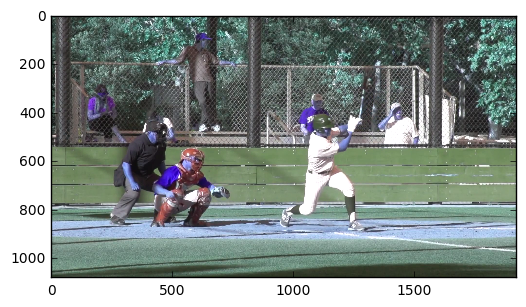

/Users/ninawiedemann/Desktop/UNI/Praktikum/tensor/notebooks/data/Michael_Chavez/000.jpg


In [173]:
"""path = "/Volumes/Nina Backup/videos/atl/2017-04-19/center field/"
vid_example = "490324-0ade0abd-fb64-49ca-aacd-66a50901f538.mp4"
cap = cv2.VideoCapture(path+vid_example)

for i in open(path+vid_example+".dat").readlines():
    datContent=ast.literal_eval(i)

bottom_b=datContent['Batter']['bottom']
left_b=datContent['Batter']['left']
right_b=datContent['Batter']['right']
top_b=datContent['Batter']['top']
bottom_p=datContent['Pitcher']['bottom']
left_p=datContent['Pitcher']['left']
right_p=datContent['Pitcher']['right']
top_p=datContent['Pitcher']['top']
cap.set(cv2.CAP_PROP_POS_FRAMES, 85)
images_pitcher = []
images_batter = []
for i in range(10):
    ret, frame = cap.read()
    images_pitcher.append(frame[top_p:bottom_p, left_p:right_p])
    images_batter.append(frame[top_b:bottom_b, left_b:right_b])"""

def color_box(frame, bbox, color = "red"):
    """
    vid: path to video or image file
    bbox: [oben, unten, links, rechts] bzw [kleineres_y, größeres_y, kleineres_x, größeres_x]
    kann sein dass das bei dir anderes ist, bei mir ist eben die y achse immer die werte umgedreht,
    also oben sind kleinere werte als unten
    """
    # for video:
    #video_capture = cv2.VideoCapture(vid)
    #ret, frame = video_capture.read()
    # for image
    #frame = plt.imread(vid)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(frame, aspect='equal')

    ax.add_patch(
    plt.Rectangle((int(bbox[2]), int(bbox[0])), # linkes oberes eck
                  int(bbox[3]-bbox[2]), # länge von der seite von oben nach unten
                  int(bbox[1]-bbox[0]), fill=False, #länge von der seite von links nach rechts
                  edgecolor=color, linewidth=3.5)
    )
    plt.show()

path = "/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/batter/"
vid_example = "#11 Mark Mathias (2).mp4"
cap = cv2.VideoCapture(path+vid_example)
with open("/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/center_dics.json", "r") as infile:
    dictionary = json.load(infile)
center = dictionary[vid_example[:-4]]
print(center)
bbox = [center[1]-500, center[1]+300, center[0]-1400, center[0]+100]
cap.set(cv2.CAP_PROP_POS_FRAMES, 255)
fps= cap.get(cv2.CAP_PROP_FPS)
print(fps)
images = []


for i in range(1):#280):
    ret, frame = cap.read()
    #frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    a = frame #[bbox[0]:bbox[1], bbox[2]:bbox[3]]
    #b =frame_gray>200
    plt.imshow(a)
    plt.gray()
    plt.show()
    #images.append(a) #frame_gray[bbox[0]:bbox[1], bbox[2]:bbox[3]])
    #cv2.imwrite("/Users/ninawiedemann/Desktop/UNI/Praktikum/tensor/notebooks/data/Michael_Chavez/%03d.jpg" % i, a)
    if i ==0:
        print("/Users/ninawiedemann/Desktop/UNI/Praktikum/tensor/notebooks/data/Michael_Chavez/%03d.jpg" % i)
    #color_box(frame, bbox)
#bbox = [center[0]]

#with open("dic_release_high_quality.json", "w") as outfile:
 #   json.dump(dic_release_high_quality, outfile)

In [ ]:
a = images[2] #np.zeros((200,200))
#a[50:150,50:150]=1
window_size = 100
maxi = np.inf
maxi_ind = (i,j)
maxi_img = []
var_img = []
for i in range(window_size//2, len(a)-window_size//2, 3):
    maxi_img_inner = []
    var_img_inner = []
    for j in range(window_size//2, len(a[0])-window_size//2, 3):
        # print(i,j)
        patch = a[i-window_size//2:i+window_size//2, j-window_size//2:j+window_size//2]
        blur = cv2.Laplacian(patch, cv2.CV_64F).var()
        var_img_inner.append(np.std(patch))
        maxi_img_inner.append(blur)
        if blur<maxi:
            maxi= blur
            maxi_ind = (i,j)
    maxi_img.append(maxi_img_inner)
    var_img.append(var_img_inner)

print(maxi_ind)
#print(maxi_img)
#print(cv2.Laplacian(a, cv2.CV_64F).var())

In [ ]:
#print(var_img)
var_img = np.array(var_img)
plt.imshow(var_img)
plt.show()
var_img_new = var_img/np.max(var_img)
maxi_img = np.array(maxi_img)
#maxi_img = 20-maxi_img
#maxi_img[maxi_img<0]==0
plt.imshow(maxi_img)
plt.show()
maxi_img_new = 1-(maxi_img/np.max(maxi_img))
result = (maxi_img_new+var_img_new)/2
plt.imshow(result)
plt.show()

In [ ]:
from scipy import ndimage
for i, img in enumerate(images):
    img = ndimage.filters.gaussian_filter(img, sigma = 20)
    if i>0:
        diff = np.absolute(before-img)
        diff_smooth = ndimage.filters.gaussian_filter(diff, sigma = 20)
        #print(diff)
        plt.imshow(diff_smooth)
        plt.show()
    before = img

# compare different normalization methods - to make high quality videos comparable to old ones

(5598, 12, 2)


/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in true_divide


(100, 5598, 12, 2)


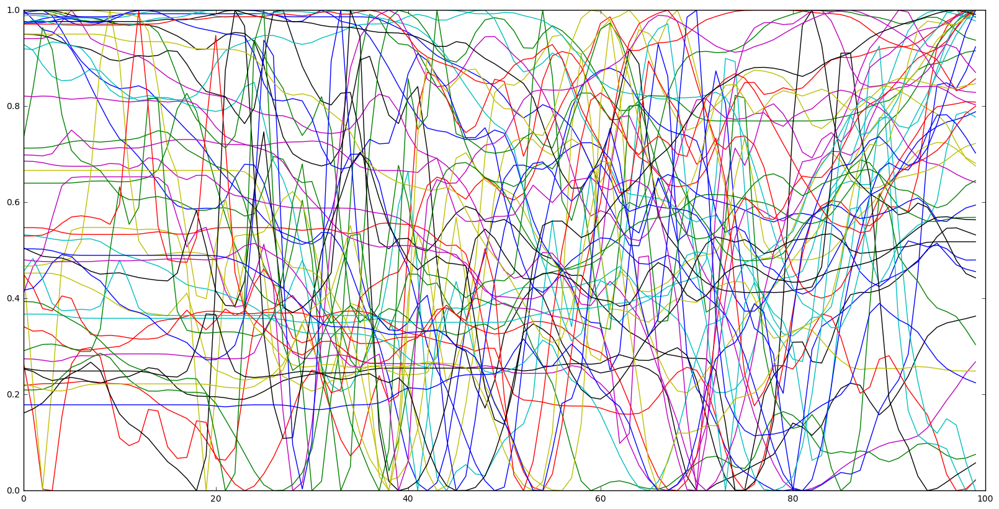

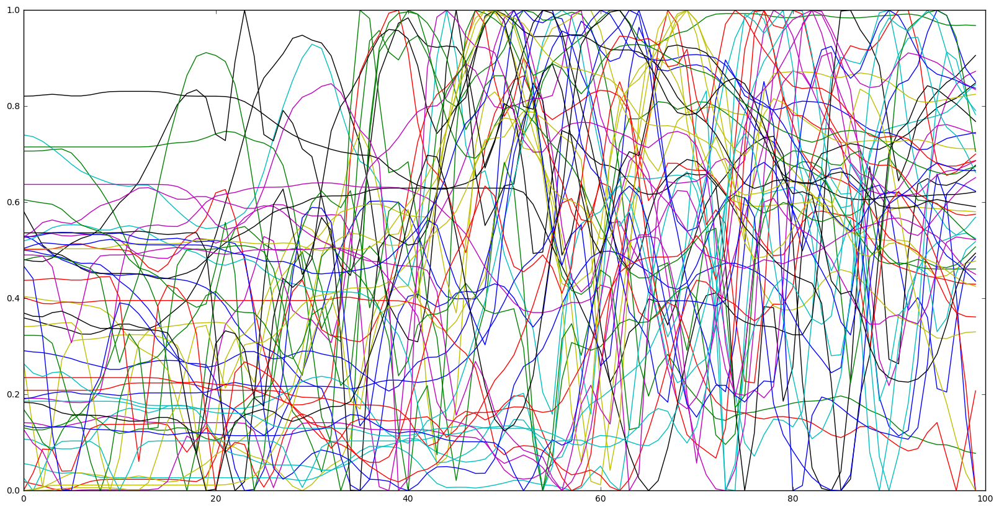

(23, 12, 2)
(100, 23, 12, 2)


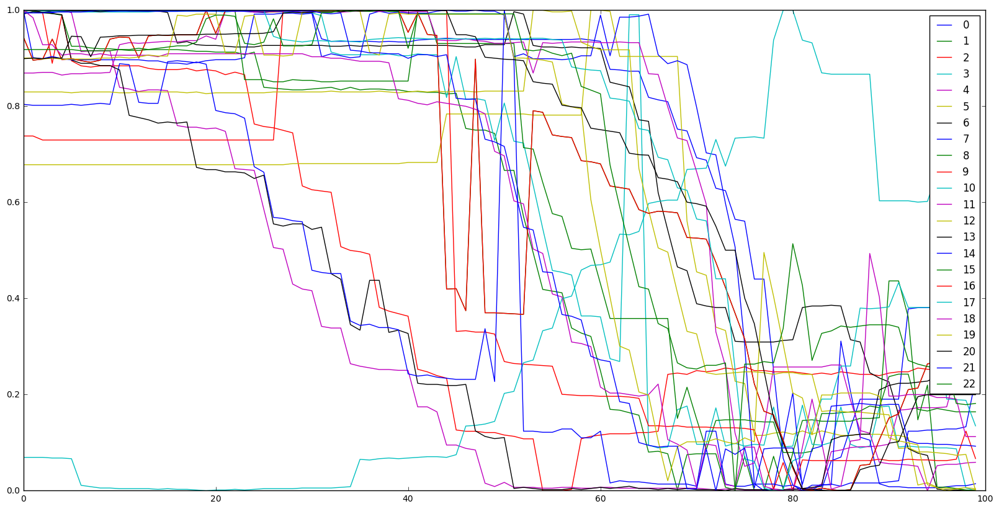

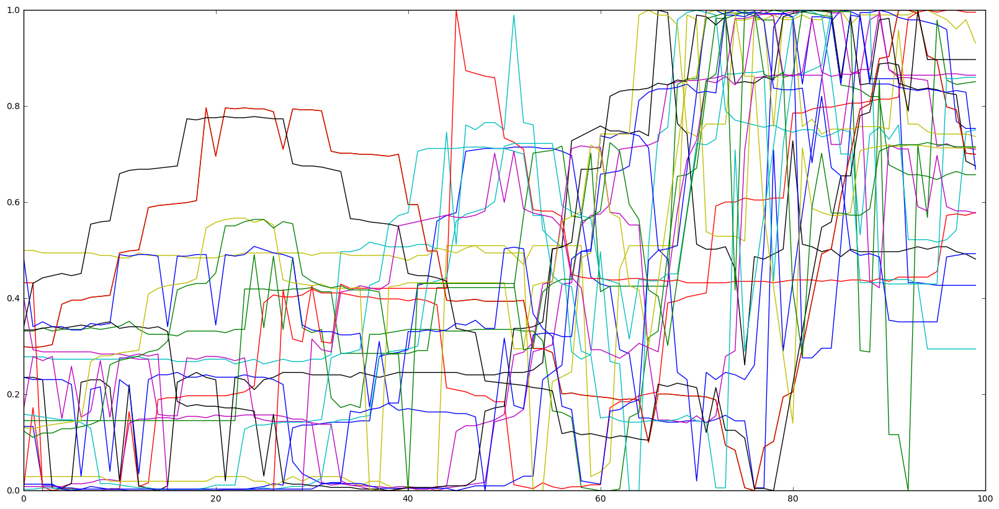

In [18]:
#print(testing_data)

def norm0(data):
    return (data-np.mean(data))/np.std(data)
def norm1(data):
    # per example
    norm = data.copy()
    for i, exp in enumerate(data):
        norm[i] = (exp-np.mean(exp))/np.std(exp)
    return norm
def norm2(data):
    mins = np.amin(data, axis=1)
    maxs = np.amax(data, axis = 1)
    new = [(data[:,i]- mins)/(maxs-mins) for i in range(len(data[0]))]
    return np.swapaxes(new, 0,1)
    # return (data-np.min(data))/(np.max(data)-np.min(data))
def norm3(data):
    # per trajectory
    means = np.mean(data, axis = 1)
    stds = np.mean(data, axis = 1)
    new = [(data[:,i]- means)/stds for i in range(len(data[0]))]
    return np.swapaxes(new, 0,1)
def norm4(data):
    #log transform
    log_transformed = np.log(data)
    #print(log_transformed)
    return norm1(log_transformed)
smooth_data = scipy.ndimage.filters.gaussian_filter1d(training_data, axis = 1, sigma = 1)
plot_data = norm2(smooth_data)[:50]
plot_data = np.swapaxes(plot_data, 0,1)
plt.figure(figsize=(20,10))
plt.plot(plot_data[:,:,5,0])
plt.show()
plt.figure(figsize=(20,10))
plt.plot(plot_data[:,:,5,1])
plt.show()
    
"""
for i in range(len(testing_data)):
    for j in range(len(testing_data[0])):
        for k in range(len(testing_data[0,0])):
            for l in range(2):
                if testing_data[i,j,k, l]==0:
                    print(i,j,k,l)
"""
    #print(np.any(testing_data==0))
plot_data = norm2(a) #scipy.ndimage.filters.gaussian_filter1d(testing_data, axis = 1, sigma = 1) #norm4(a)
plot_data = np.swapaxes(plot_data, 0,1)
plt.figure(figsize=(20,10))
for i in range(len(plot_data[0])): 
    plt.plot(plot_data[:,i,5,0], label = i)
plt.legend()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(plot_data[:,:,5,1])
plt.show()

# Plots for paper: occurences of release frame, first movement and so on

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (253,254,255,256,257,258,259,289) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


['Stretch' 'Unknown' 'Windup']
[7590, 1124, 4436]


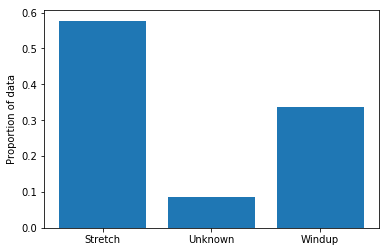

0.0934641609845
[8, 24, 36, 44, 46, 68, 96, 90, 110, 98, 138, 114, 128, 124, 76, 108, 162, 140, 104, 100, 122, 126, 104, 128, 112, 150, 110, 134, 120, 162, 160, 174, 158, 160, 212, 190, 218, 272, 268, 334, 354, 370, 426, 506, 554, 570, 656, 654, 616, 496, 474, 410, 316, 228, 172, 122, 136, 132, 92, 82, 52, 64, 60, 68, 46, 36, 38, 24, 8, 12, 8, 20, 12, 2, 2]


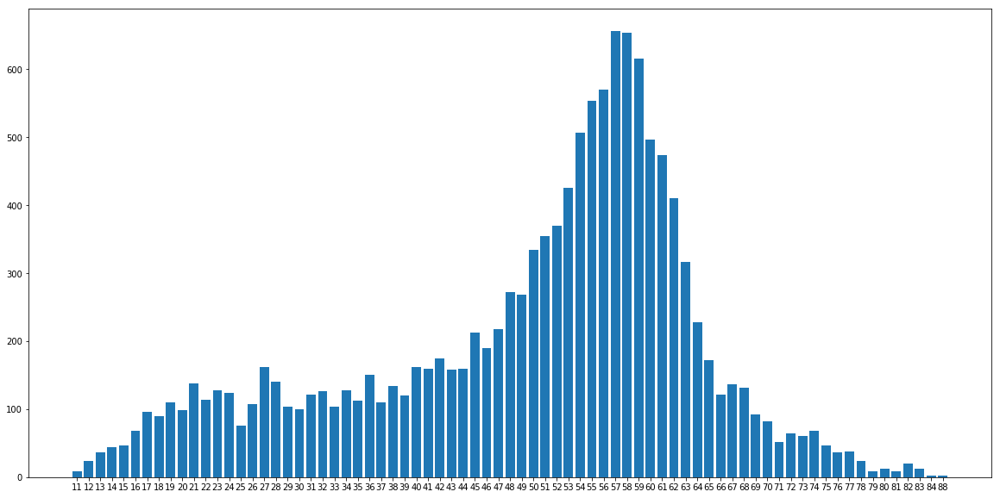

[2, 4, 2, 6, 6, 12, 96, 182, 420, 918, 3712, 2704, 2344, 1492, 510, 150, 518, 26, 6, 8, 4, 2]


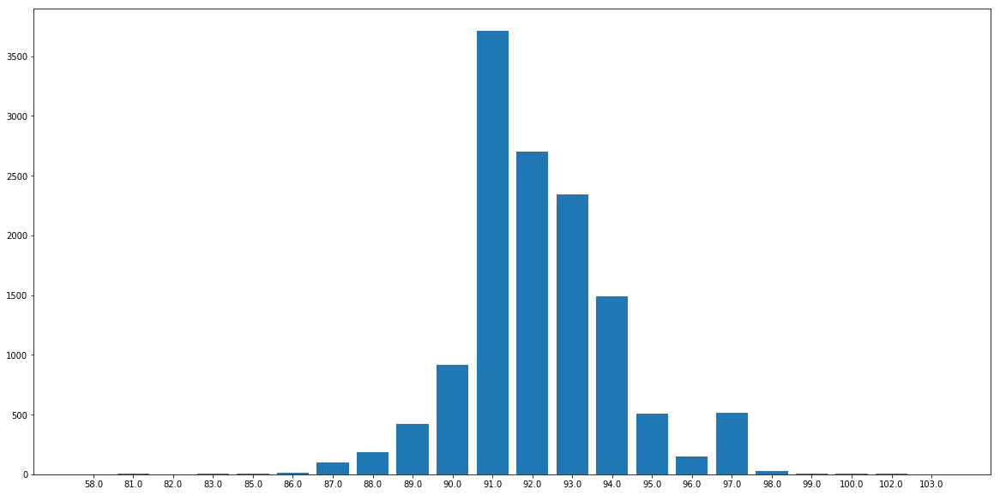

In [5]:
# RELEASE FRAME

"""
pos = cf["pitch_frame_index"].values.copy()
for i in range(len(pos)):
    if np.isnan(pos[i]) or pos[i]<70 or pos[i]>110:
        print(i)
ind = np.where(pd.isnull(pos))[0]
print(ind)
pos[ind]= 3
ind = np.where(pos<0)[0]
print(ind)
pos[ind]= 4 # "Unkown"
ind = np.where(pos>160)[0]
print(ind)
pos[ind]= 2
ind = np.where(pos>10)[0]
pos[ind]= 1

uni = np.unique(pos)
print(uni)
nr = []
for classe in np.unique(pos):
    nr.append(len(np.where(pos==classe)[0]))
    #dic[classe]=nr

labels = ["right label", "frame more than 160", "negative frame", "NaN" ]
#print(list(dic.keys()), dic.values())
plt.bar(uni, nr, align="center")
plt.xticks(uni, labels)
plt.title("Missing values in Pitching Position")
plt.show()
"""
cf = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/train_data/cf_data.csv")
# POSITION

pos = cf["Pitching Position (P)"].values.copy()
ind = np.where(pd.isnull(pos))[0]
pos[ind]= np.NaN # "Unkown"
#ind = np.where(pos=="Unkown")[0]
pos[ind]="Unknown"
uni = np.unique(pos)
print(uni)
nr = []
for classe in np.unique(pos):
    nr.append(len(np.where(pos==classe)[0]))
    #dic[classe]=nr
print(nr)
nr = np.array(nr)
nr = nr/np.sum(nr)
#print(list(dic.keys()), dic.values())
plt.bar(np.arange(1, len(uni)+1,1), nr, align="center")
plt.xticks(np.arange(1, len(uni)+1,1), uni)
# plt.xlabel("label")
plt.ylabel("Proportion of data")
# plt.title("Missing values in Pitching Position")
plt.show()

print(nr[1]/(nr[0]+nr[2]))

pos= cf["first_movement_frame_index"].values
ind = np.where(pd.isnull(pos))[0]
pos[ind]= 0 
ind = np.where(pos>10)[0]
pos = pos[ind]
ind = np.where(pos<160)[0]
pos = pos[ind]
uni = np.unique(pos)
nr = []
for classe in np.unique(pos):
    nr.append(len(np.where(pos==classe)[0]))
    #dic[classe]=nr
print(nr)
fig = plt.figure(figsize=(20,10))
plt.bar(np.arange(1, len(uni)+1,1), nr, align="center")
plt.xticks(np.arange(1, len(uni)+1,1), uni.astype(int))
# plt.title("Distribution of first movement frame index")
plt.show()


pos= cf["pitch_frame_index"].values
ind = np.where(pd.isnull(pos))[0]
pos[ind]= 0 
ind = np.where(pos>10)[0]
pos = pos[ind]
ind = np.where(pos<160)[0]
pos = pos[ind]
uni = np.unique(pos)
nr = []
for classe in np.unique(pos):
    nr.append(len(np.where(pos==classe)[0]))
    #dic[classe]=nr
print(nr)
fig = plt.figure(figsize=(20,10))
plt.bar(np.arange(1, len(uni)+1,1), nr, align="center")
plt.xticks(np.arange(1, len(uni)+1,1), uni)
# plt.title("Distribution of release frame index")
plt.show()


# Test model - get example images for outputs

#5 RHP Matt Blais (3) 327.0 335


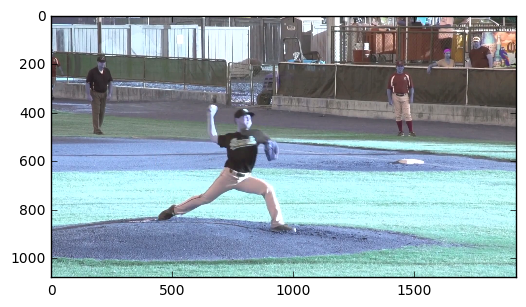

#26 RHP Tim Willites (2) 181.0 190


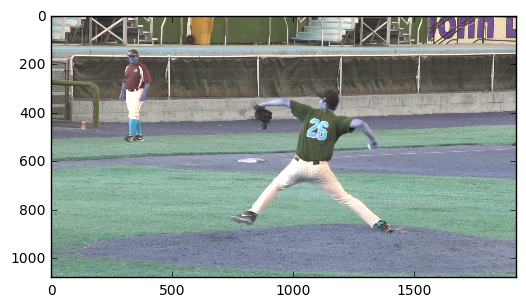

#5 RHP Matt Blais 251.0 252


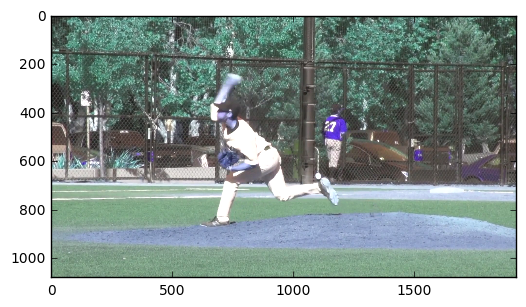

#42 LHP Michael Chavez 475.0 470


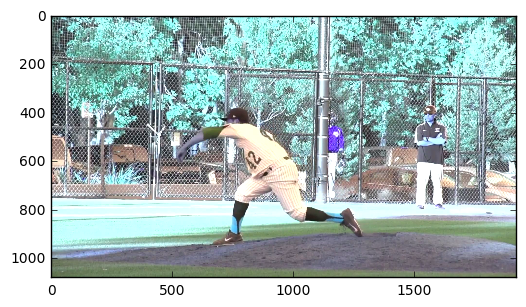

#5 RHP Matt Blais 5-3 GO (2) 151.0 158


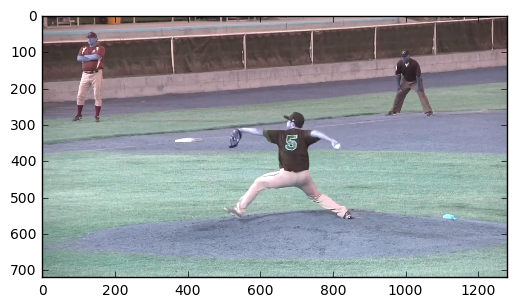

#31 LHP Michael Chavez 5-3 GO 72.0 78


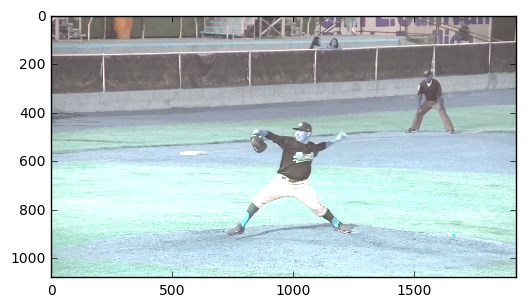

#9 RHP Ryan King 143.0 150


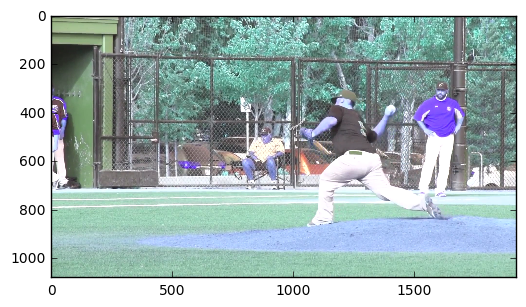

#26 RHP Tim Willites (3) 150.0 158


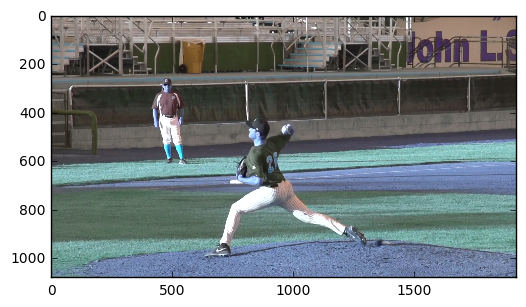

#5 RHP Matt Blais 5-3 GO 147.0 160


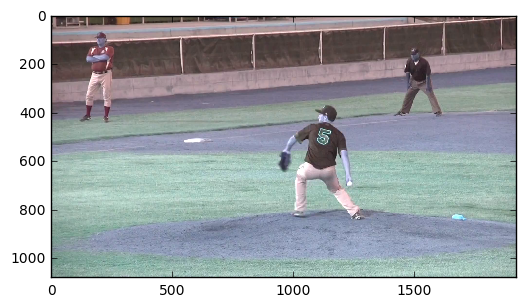

#31 LHP Michael Chavez 348.0 345


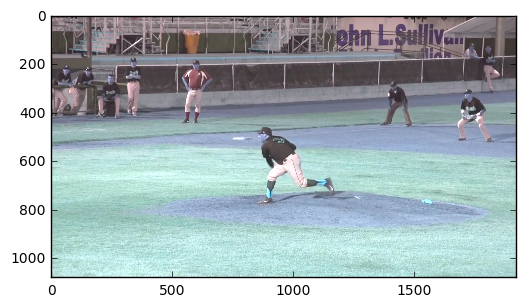

#48 RHP Tom Flippin 6-3 GO 531.0 525


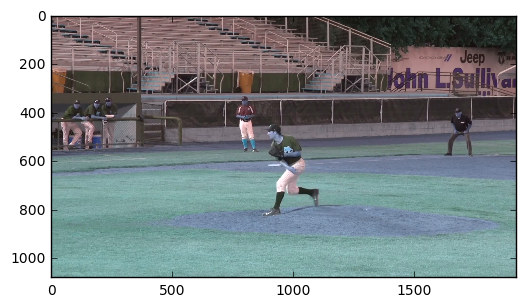

#9 RHP Ryan King (2) 169.0 170


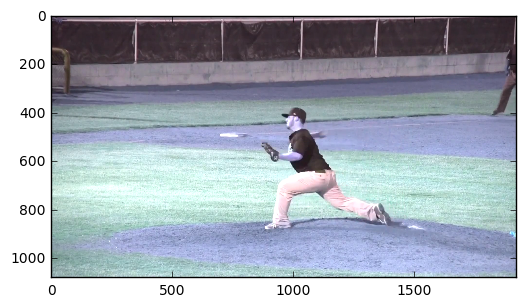

#00 RHP Devin Smith 130.0 130


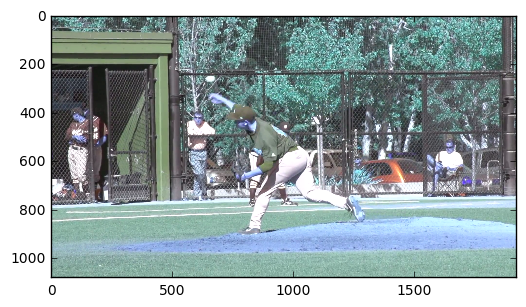

#4 RHP Parker Swindell 112.0 125


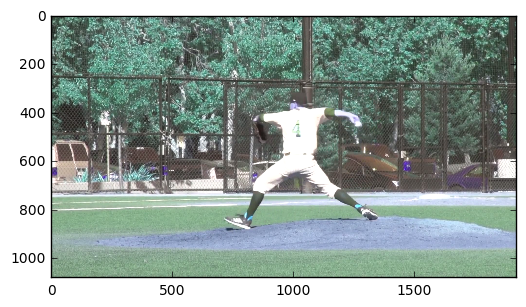

#5 RHP Matt Blais (2) 327.0 335


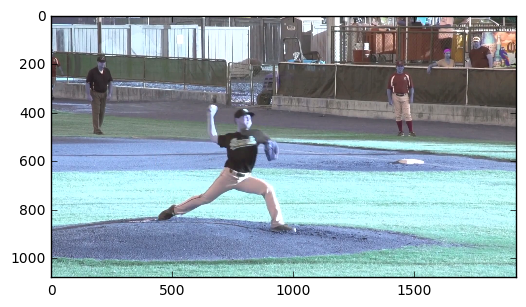

#5 RHP Matt Blais (4) 129.0 138


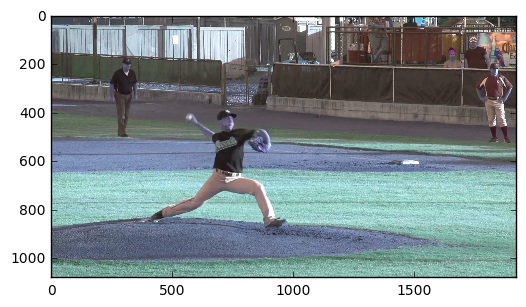

#26 RHP Tim Willites 187.0 188


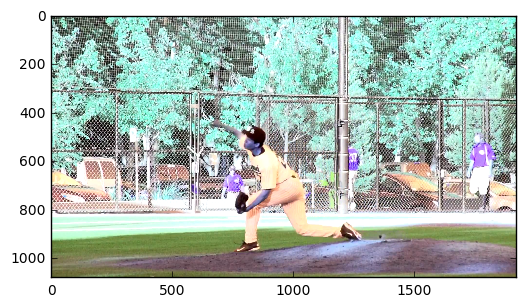

#5 RHP Matt Blais (5) 301.0 305


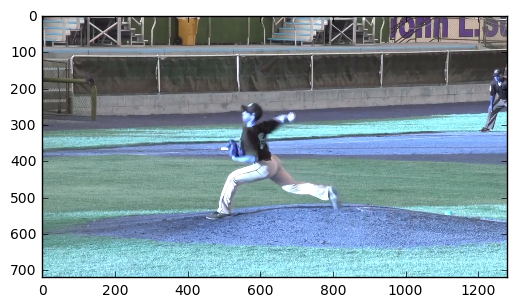

#48 RHP Tom Flippin 271.0 282


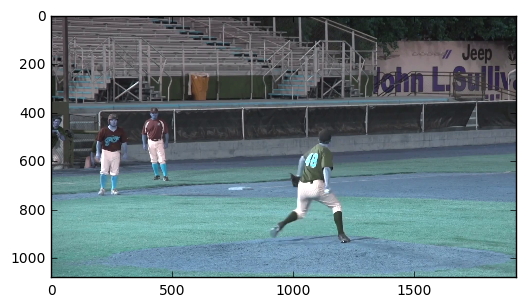

#8 RHP Cole Johnson 87.0 90


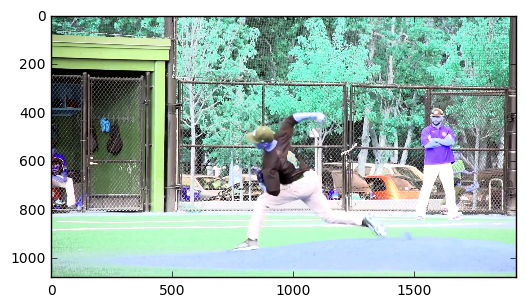

#31 LHP Michael Chavez (3) 158.0 160


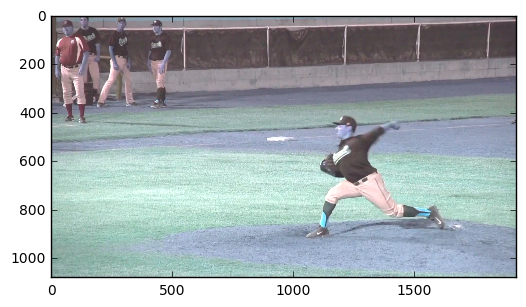

#31 LHP Michael Chavez (2) 176.0 165


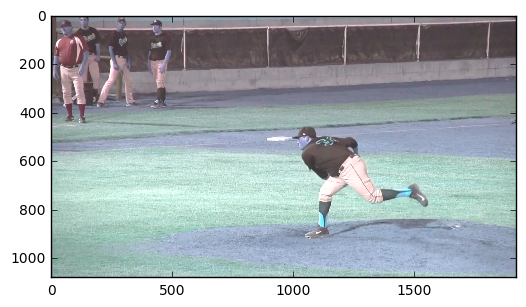

#8 RHP Cole Johnson (2) 115.0 115


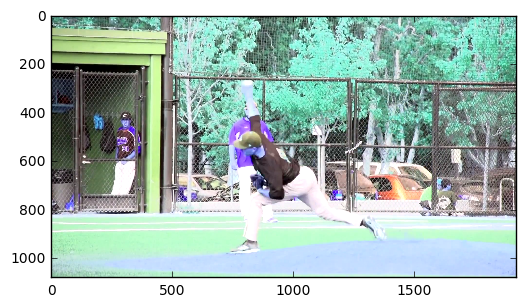

#45 LHP Steffen Simmons (2) 224.0 230


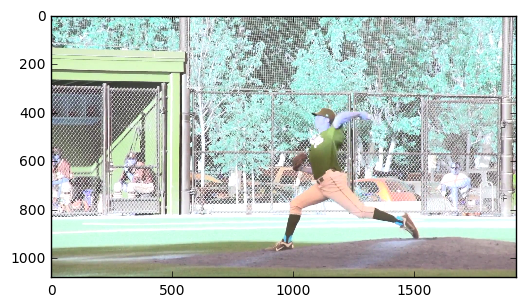

Menlo Park Legends #98 RHP Zac Grotz 291.0 290


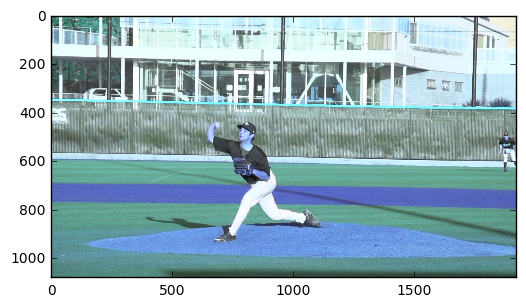

#45 LHP Steffen Simmons 224.0 230


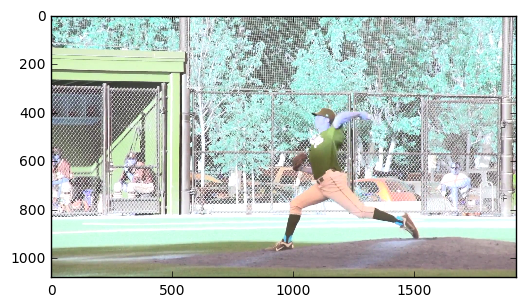

In [16]:
with open("results_high_quality_smooth.json", "r") as infile:
    results = json.load(infile)
dic_release_high_quality = {"#31 LHP Michael Chavez (2)": 165, "#00 RHP Devin Smith": 130, "#4 RHP Parker Swindell": 125,
                           "#5 RHP Matt Blais (2)": 335, "#5 RHP Matt Blais (3)":335, "#5 RHP Matt Blais (4)": 138,
                            "#5 RHP Matt Blais (5)": 305, "#5 RHP Matt Blais 5-3 GO (2)": 158, "#5 RHP Matt Blais 5-3 GO": 160,
                            "#8 RHP Cole Johnson (2)": 115, "#8 RHP Cole Johnson": 90, "#9 RHP Ryan King (2)": 170,
                            "#9 RHP Ryan King": 150, "#26 RHP Tim Willites (2)":190, "#26 RHP Tim Willites (3)":158,
                            "#26 RHP Tim Willites": 188, "#31 LHP Michael Chavez (3)": 160, "#31 LHP Michael Chavez":345,
                            "#31 LHP Michael Chavez 5-3 GO": 78, "#42 LHP Michael Chavez": 470, "#45 LHP Steffen Simmons (2)":230,
                            "#45 LHP Steffen Simmons": 230, "#48 RHP Tom Flippin 6-3 GO": 525, "#48 RHP Tom Flippin": 282,
                            "Menlo Park Legends #98 RHP Zac Grotz":290, "#5 RHP Matt Blais": 252}

path = "/Users/ninawiedemann/Desktop/UNI/Praktikum/high_quality_testing/pitcher/"
for person in list(dic_release_high_quality.keys()):
    out = dic_release_high_quality[person]-results["shift"]+results[person]
    cap = cv2.VideoCapture(path+person+".mp4")
    cap.set(cv2.CAP_PROP_POS_FRAMES, out)
    print(person, out, dic_release_high_quality[person])
    for i in range(1):#280):
        ret, frame = cap.read()
        plt.imshow(frame)
        plt.show()